This is proposed to combact the issues of loss saturation and vanishing gradient in GAN. LSGAN was also shown to result in more stable training and producing results that are higher in quality. Standard GAN is trained using cross entropy loss which outputs weather a prediction is correct or wrong rather than how correct or wrong the prediction might be. The discriminator, after training will have a decision boundary that seperates the real and fake samples. The generator will generate points in this space that may be classified as real or fake by the discriminator. 

Assume a point in this space is classified as fake. The choice of cross entropy loss will not take into account how far or near the point is from the boundary. Therefore, the gradient generated will be small and the error backpropagated will be small causing vanishing gradients.

In Least Squares GAN, instead of using cross entropy loss, least squared loss will be used. This will calculate the distance between point and boundary so the further away from boundary a point is, the more the point will be penalized and this allows bigger gradients to be produced. The error  backpropagated will be bigget and this reduce vanishing gradient problem.


In [10]:
import torch
from torch import nn
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.datasets import FashionMNIST
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import torchvision
import os

In [11]:
class Generator(nn.Module):
    def __init__(self, z_dim = 10, img_channels = 1, hidden_dim = 64):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            self.gen_block(z_dim, hidden_dim * 16, 4, 1, 0),
            self.gen_block(hidden_dim*16, hidden_dim*8, 4, 2, 1),
            self.gen_block(hidden_dim*8, hidden_dim*4, 4, 2, 1),
            self.gen_block(hidden_dim*4, hidden_dim*2, 4, 2, 1),
            nn.ConvTranspose2d(hidden_dim*2, 1, kernel_size =4, stride = 2, padding = 1),
            nn.Tanh()
        )
        
    def gen_block(self, input_channels, output_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding, bias = False),
            nn.BatchNorm2d(output_channels),
            nn.ReLU()
        )
    
    def forward(self, noise):
        return self.gen(noise)

In [12]:
def get_noise(n_samples, z_dim):
    return torch.randn(n_samples, z_dim, 1, 1).to('cuda')

In [13]:
class Discriminator(nn.Module):
    def __init__(self, img_channels, hidden_dim = 64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(img_channels, hidden_dim, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2),
            self.disc_block(hidden_dim, hidden_dim * 2, 4, 2, 1),
            self.disc_block(hidden_dim * 2, hidden_dim * 4, 4, 2, 1),
            self.disc_block(hidden_dim * 4, hidden_dim * 8, 4, 2, 1), # 4x4
            nn.Conv2d(hidden_dim * 8, 1, kernel_size = 4, stride = 2, padding = 0), # 1x1
#             nn.Sigmoid()
        )
    
    def disc_block(self, input_channels, output_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding, bias = False),
            nn.BatchNorm2d(output_channels),
            nn.LeakyReLU(0.2)
        )
    
    def forward(self, img):
        return self.disc(img)

In [14]:
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [15]:
z_dim = 100
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    FashionMNIST('.', download = False, transform = transform),
    batch_size = batch_size,
    shuffle = True
)

In [16]:
criterion = torch.nn.MSELoss()

gen = Generator(z_dim, 1, 64).to(device)
init_weights(gen)
gen_opt = torch.optim.RMSprop(gen.parameters(), lr = lr)

disc = Discriminator(1, 64).to(device)
init_weights(disc)
disc_opt = torch.optim.RMSprop(disc.parameters(), lr = lr)

In [17]:
import numpy as np

def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    img = img.detach().cpu()
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

Epochs: 0 Step: 100 Generator loss: 4.194589570723474, discriminator loss: 1.7726707019656898


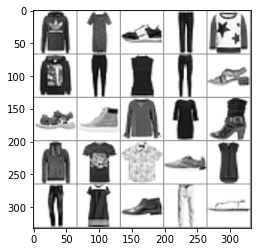

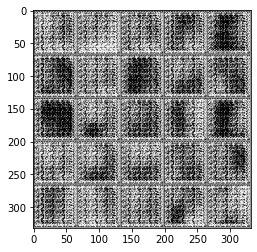

Epochs: 0 Step: 200 Generator loss: 1.2311235228180886, discriminator loss: 0.11731784197501838


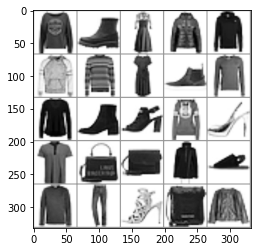

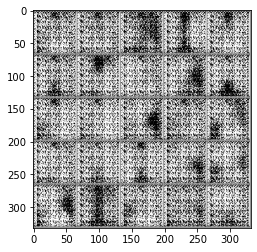

Epochs: 0 Step: 300 Generator loss: 1.2345129296183586, discriminator loss: 0.11279238750692457


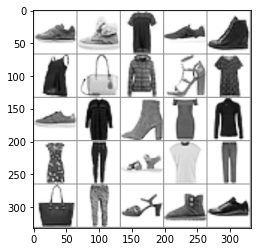

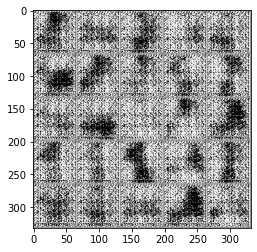

Epochs: 0 Step: 400 Generator loss: 1.2067022934556006, discriminator loss: 0.1366571148391813


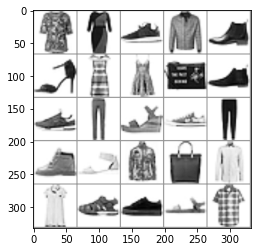

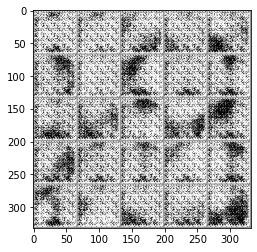

Epochs: 1 Step: 500 Generator loss: 1.2768802223354578, discriminator loss: 0.12599666614085436


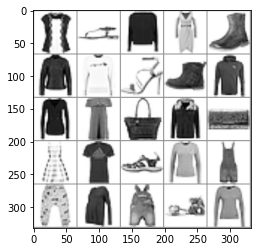

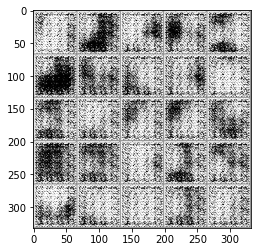

Epochs: 1 Step: 600 Generator loss: 1.1281711179018021, discriminator loss: 0.10174512136727572


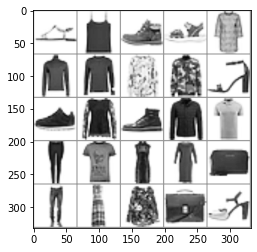

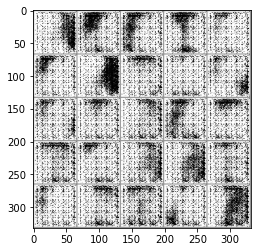

Epochs: 1 Step: 700 Generator loss: 1.1749198052287102, discriminator loss: 0.14229733697138727


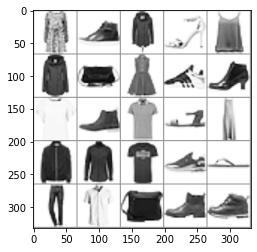

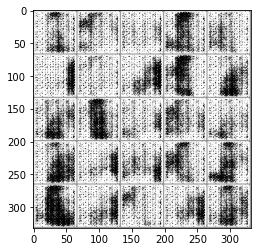

Epochs: 1 Step: 800 Generator loss: 1.1550441670417786, discriminator loss: 0.0936268762499094


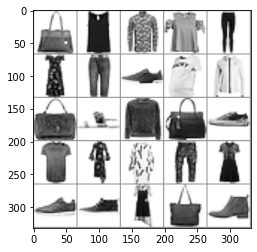

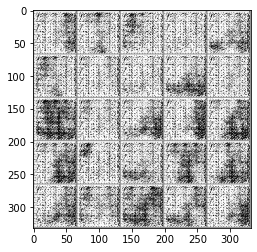

Epochs: 1 Step: 900 Generator loss: 1.1653393119573594, discriminator loss: 0.1221963774226606


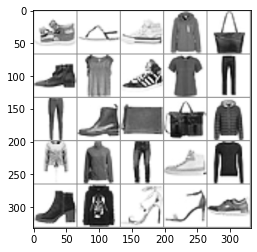

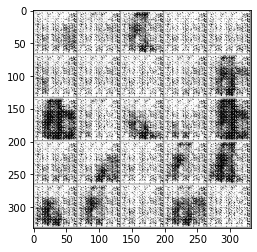

Epochs: 2 Step: 1000 Generator loss: 1.1640595760196448, discriminator loss: 0.18559179484844207


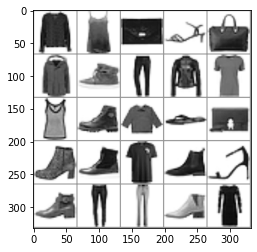

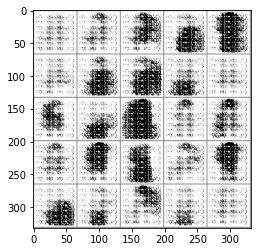

Epochs: 2 Step: 1100 Generator loss: 0.6853867545723915, discriminator loss: 0.25972047237679363


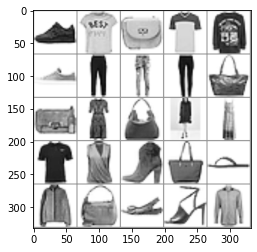

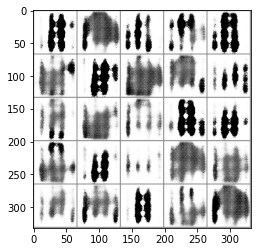

Epochs: 2 Step: 1200 Generator loss: 0.6556869523227215, discriminator loss: 0.30634271338582036


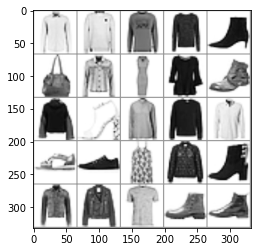

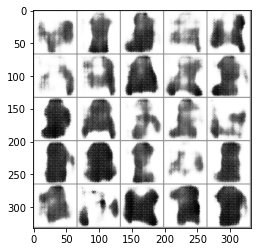

Epochs: 2 Step: 1300 Generator loss: 0.6077372518926859, discriminator loss: 0.2772265553474426


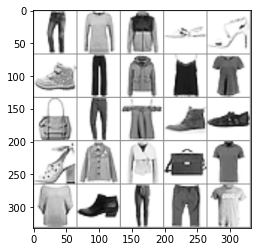

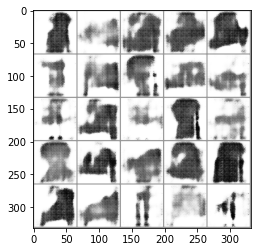

Epochs: 2 Step: 1400 Generator loss: 0.5706000784039498, discriminator loss: 0.29567438013851643


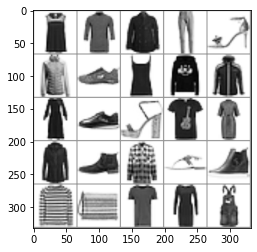

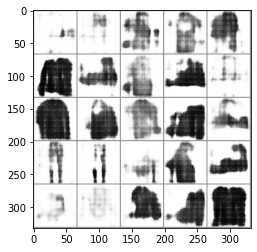

Epochs: 3 Step: 1500 Generator loss: 0.6108312318474054, discriminator loss: 0.2874866308271885


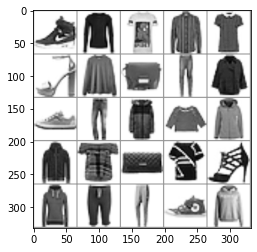

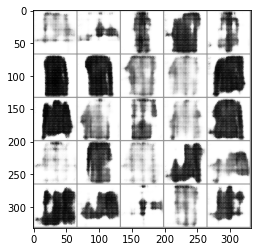

Epochs: 3 Step: 1600 Generator loss: 0.5837895210832358, discriminator loss: 0.2993976755440235


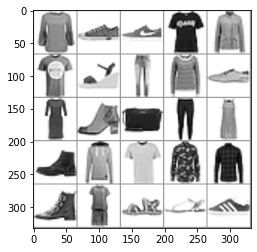

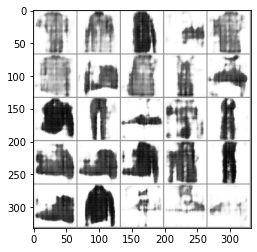

Epochs: 3 Step: 1700 Generator loss: 0.5851327497512102, discriminator loss: 0.2802274960279465


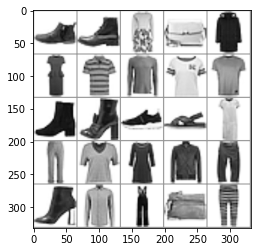

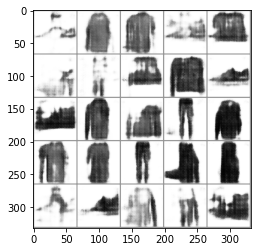

Epochs: 3 Step: 1800 Generator loss: 0.6429205662757158, discriminator loss: 0.2691004133224487


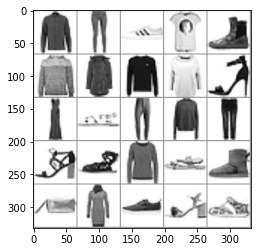

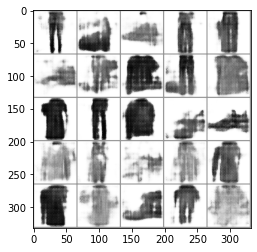

Epochs: 4 Step: 1900 Generator loss: 0.5940003580600023, discriminator loss: 0.2619455970078707


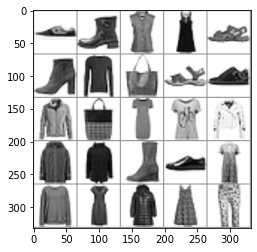

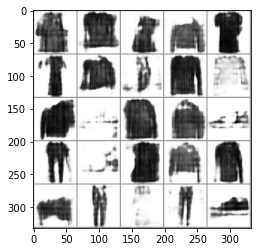

Epochs: 4 Step: 2000 Generator loss: 0.6130160871893168, discriminator loss: 0.27021819360554217


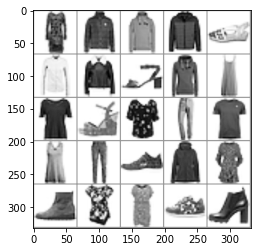

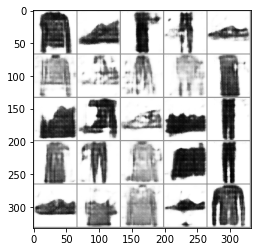

Epochs: 4 Step: 2100 Generator loss: 0.6014768762886524, discriminator loss: 0.2588415391743183


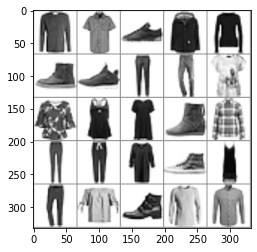

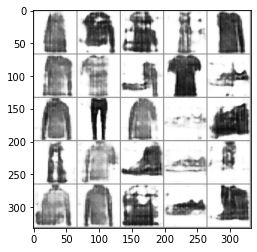

Epochs: 4 Step: 2200 Generator loss: 0.6408103411644697, discriminator loss: 0.2446648731082678


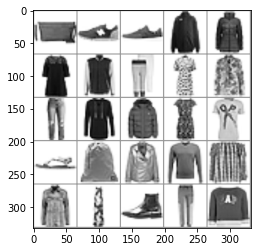

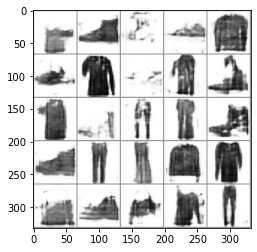

Epochs: 4 Step: 2300 Generator loss: 0.6432263977825642, discriminator loss: 0.24092277958989144


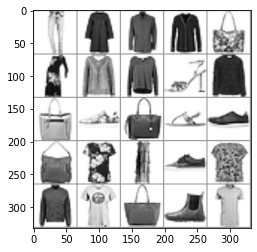

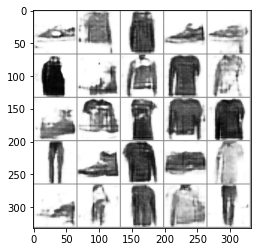

Epochs: 5 Step: 2400 Generator loss: 0.6355049849301576, discriminator loss: 0.23789349541068078


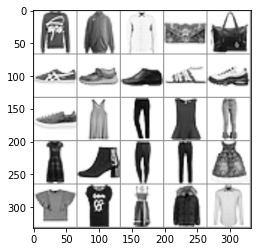

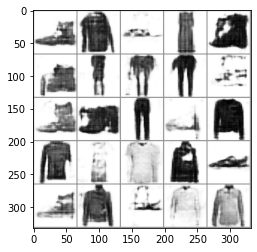

Epochs: 5 Step: 2500 Generator loss: 0.6523116324841977, discriminator loss: 0.23224141918122768


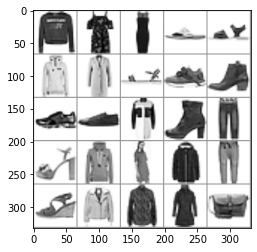

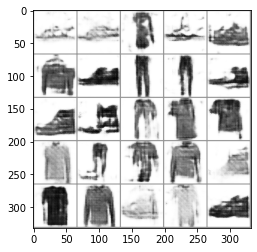

Epochs: 5 Step: 2600 Generator loss: 0.6545166233181954, discriminator loss: 0.23066653735935688


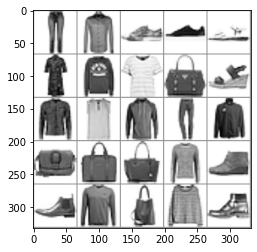

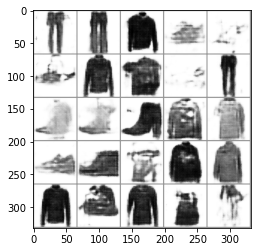

Epochs: 5 Step: 2700 Generator loss: 0.6770513895153999, discriminator loss: 0.22310302078723906


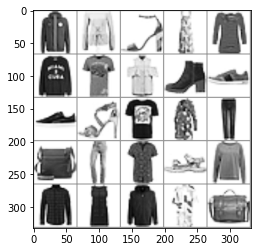

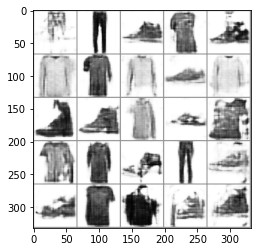

Epochs: 5 Step: 2800 Generator loss: 0.6866070450842381, discriminator loss: 0.2127886836975813


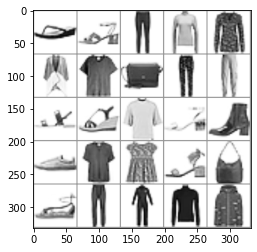

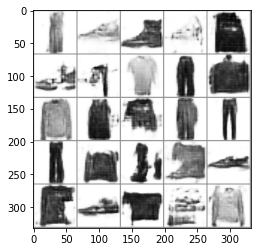

Epochs: 6 Step: 2900 Generator loss: 0.6405510069429874, discriminator loss: 0.22051936164498329


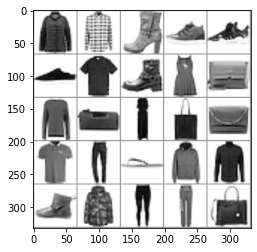

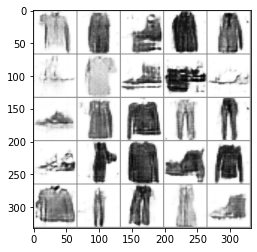

Epochs: 6 Step: 3000 Generator loss: 0.6926211278140545, discriminator loss: 0.20683450240641832


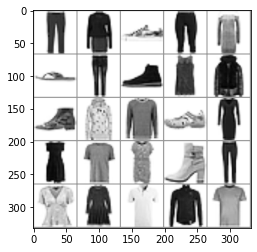

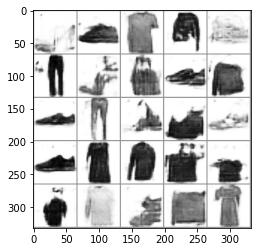

Epochs: 6 Step: 3100 Generator loss: 0.7329997426271438, discriminator loss: 0.19486595466732978


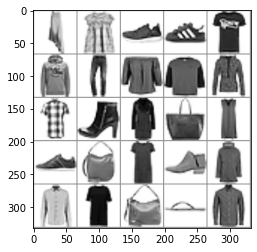

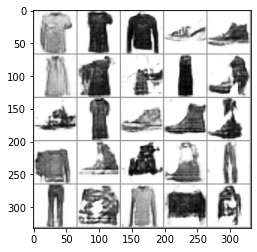

Epochs: 6 Step: 3200 Generator loss: 0.7487809592485428, discriminator loss: 0.1958308220282197


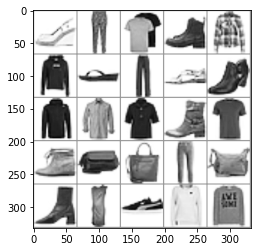

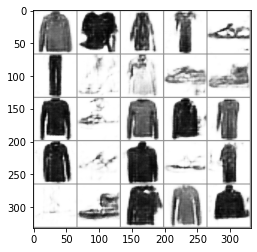

Epochs: 7 Step: 3300 Generator loss: 0.7128222101926803, discriminator loss: 0.1997107383236289


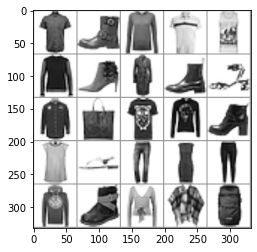

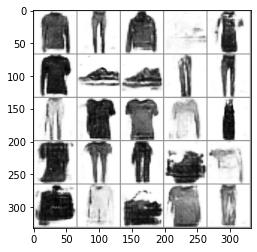

Epochs: 7 Step: 3400 Generator loss: 0.7311026206612588, discriminator loss: 0.18913149751722813


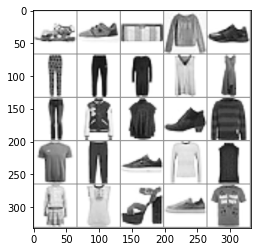

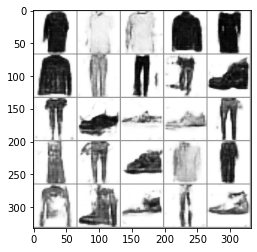

Epochs: 7 Step: 3500 Generator loss: 0.7580660675466061, discriminator loss: 0.1817834760248661


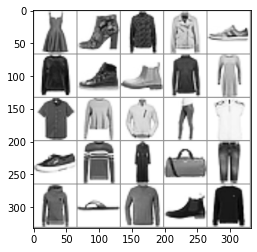

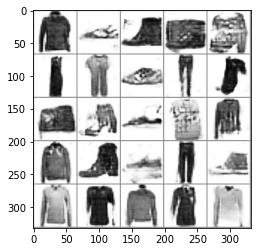

Epochs: 7 Step: 3600 Generator loss: 0.6819128722697496, discriminator loss: 0.20779979629442097


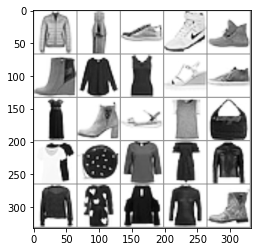

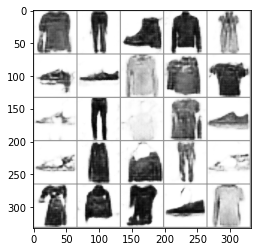

Epochs: 7 Step: 3700 Generator loss: 0.765880284011364, discriminator loss: 0.17785704417154194


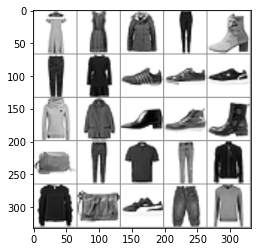

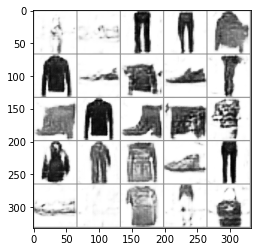

Epochs: 8 Step: 3800 Generator loss: 0.7747011578083038, discriminator loss: 0.16216337885707616


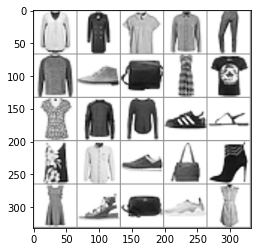

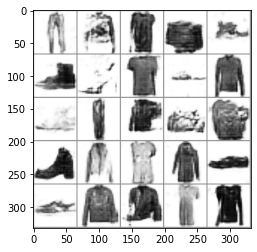

Epochs: 8 Step: 3900 Generator loss: 0.7847610890865326, discriminator loss: 0.1786010318249464


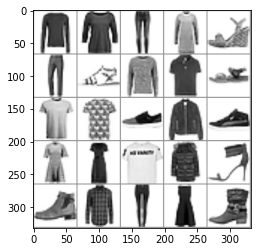

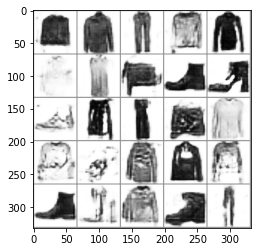

Epochs: 8 Step: 4000 Generator loss: 0.7095824445784092, discriminator loss: 0.19028396617621182


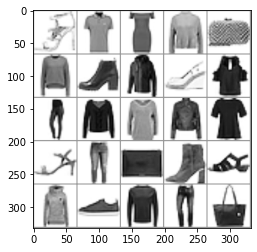

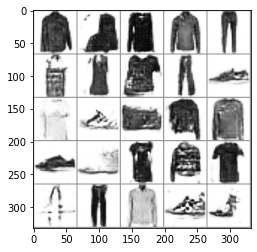

Epochs: 8 Step: 4100 Generator loss: 0.7860364204645157, discriminator loss: 0.1664927914738655


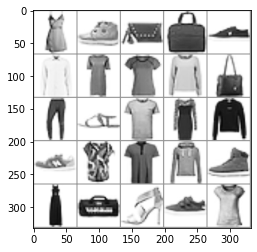

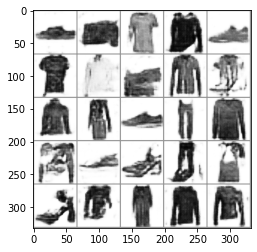

Epochs: 8 Step: 4200 Generator loss: 0.8010355705022811, discriminator loss: 0.15049031376838684


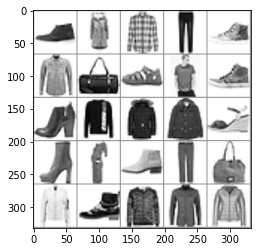

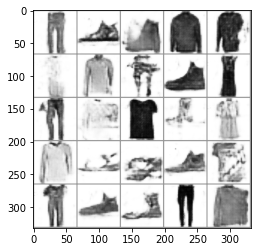

Epochs: 9 Step: 4300 Generator loss: 0.7887584914267063, discriminator loss: 0.16137218514457344


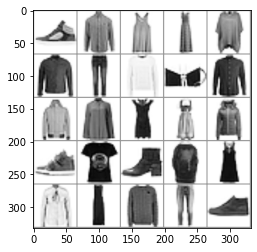

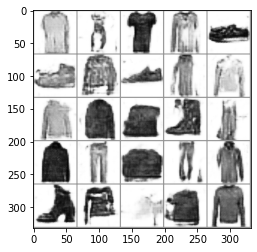

Epochs: 9 Step: 4400 Generator loss: 0.8134775353968143, discriminator loss: 0.1438269173912704


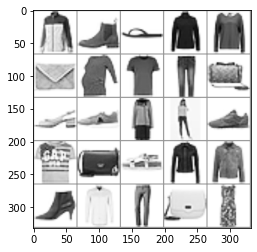

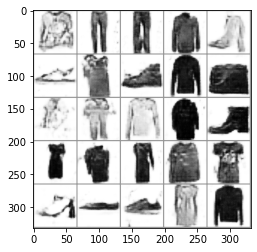

Epochs: 9 Step: 4500 Generator loss: 0.8080965811014176, discriminator loss: 0.15545536236837507


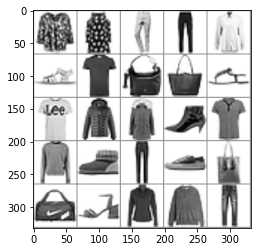

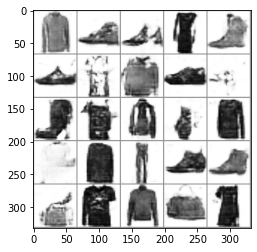

Epochs: 9 Step: 4600 Generator loss: 0.827163377404213, discriminator loss: 0.15980543034151196


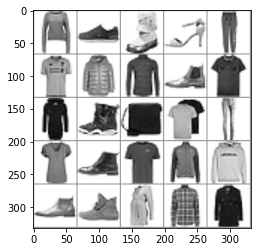

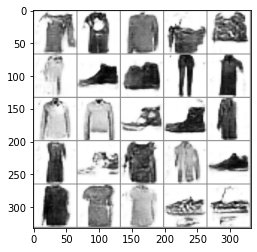

Epochs: 10 Step: 4700 Generator loss: 0.8502657885849476, discriminator loss: 0.14661329207010568


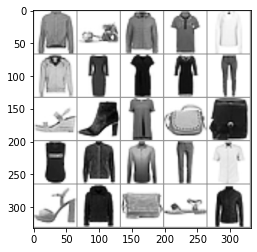

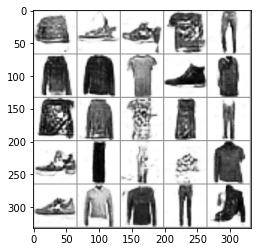

Epochs: 10 Step: 4800 Generator loss: 0.8577125036716461, discriminator loss: 0.13188848426565528


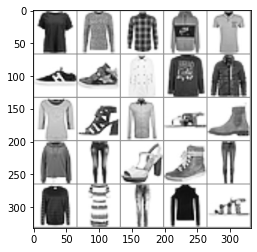

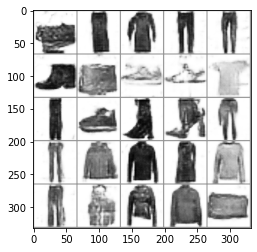

Epochs: 10 Step: 4900 Generator loss: 0.8322967904806137, discriminator loss: 0.14250757835805417


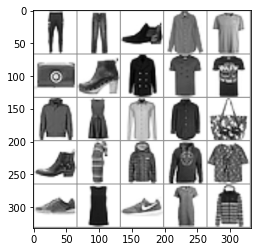

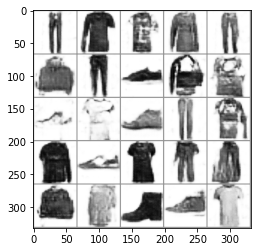

Epochs: 10 Step: 5000 Generator loss: 0.8463223898410797, discriminator loss: 0.13689555106684564


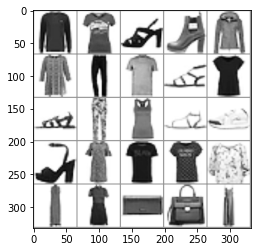

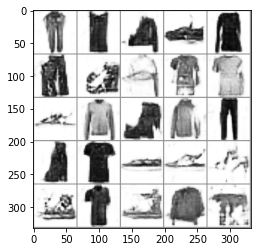

Epochs: 10 Step: 5100 Generator loss: 0.8382699520885944, discriminator loss: 0.1424037179350853


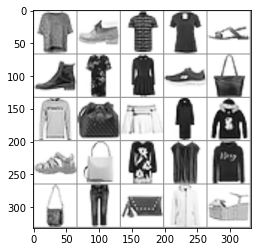

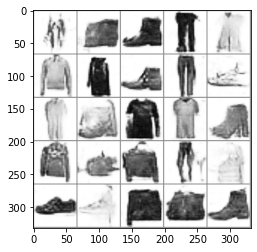

Epochs: 11 Step: 5200 Generator loss: 0.8160064925253391, discriminator loss: 0.14651872843503952


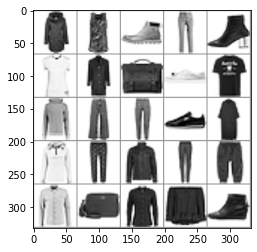

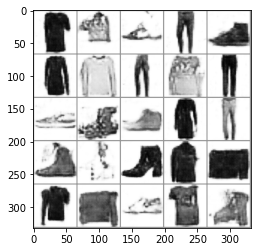

Epochs: 11 Step: 5300 Generator loss: 0.8247047165036201, discriminator loss: 0.1374101734161377


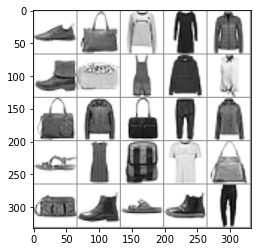

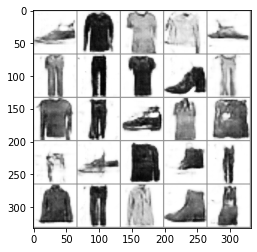

Epochs: 11 Step: 5400 Generator loss: 0.8049646744132042, discriminator loss: 0.14879161542281508


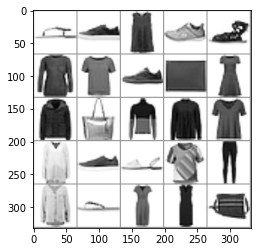

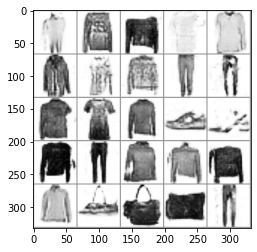

Epochs: 11 Step: 5500 Generator loss: 0.8566786974668503, discriminator loss: 0.13478937901556493


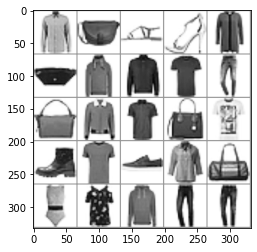

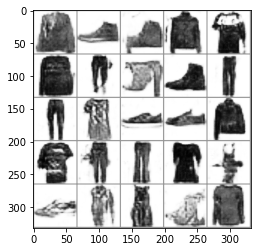

Epochs: 11 Step: 5600 Generator loss: 0.8308123645186424, discriminator loss: 0.12963299181312324


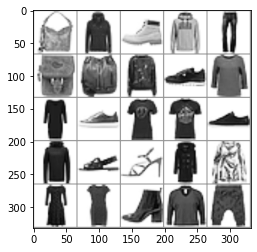

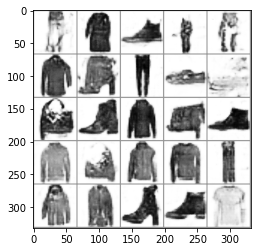

Epochs: 12 Step: 5700 Generator loss: 0.8971797129511834, discriminator loss: 0.11463691066019237


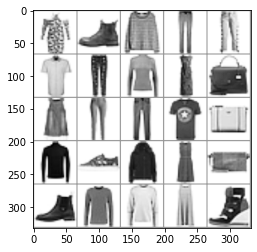

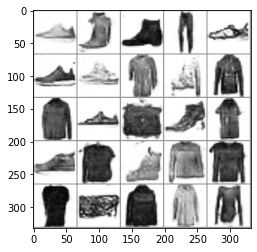

Epochs: 12 Step: 5800 Generator loss: 0.8415043571591377, discriminator loss: 0.13286494680680336


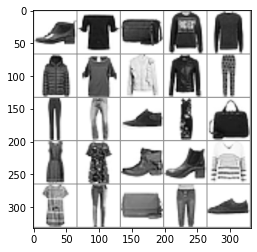

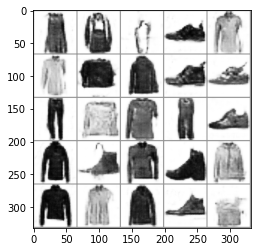

Epochs: 12 Step: 5900 Generator loss: 0.8511104348301888, discriminator loss: 0.1354382887482643


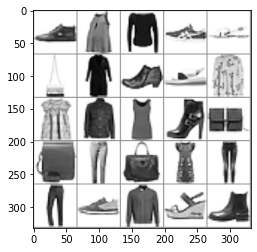

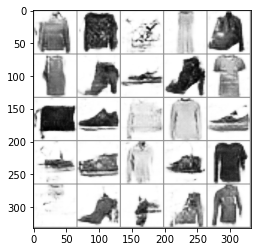

Epochs: 12 Step: 6000 Generator loss: 0.8851751241087914, discriminator loss: 0.10573493042960763


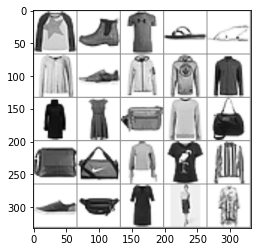

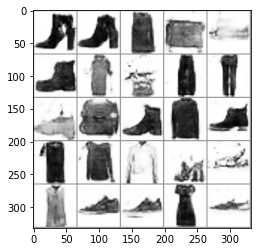

Epochs: 13 Step: 6100 Generator loss: 0.8893168863654136, discriminator loss: 0.11856601804494858


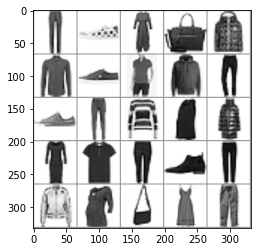

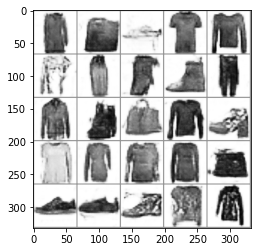

Epochs: 13 Step: 6200 Generator loss: 0.8510796129703522, discriminator loss: 0.12160523750819266


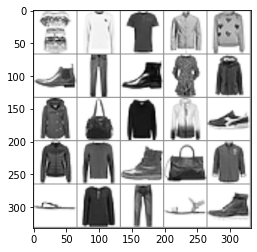

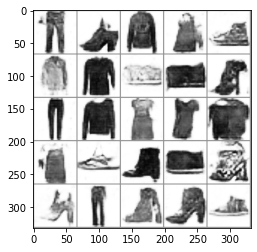

Epochs: 13 Step: 6300 Generator loss: 0.8576116001605988, discriminator loss: 0.12720421408303081


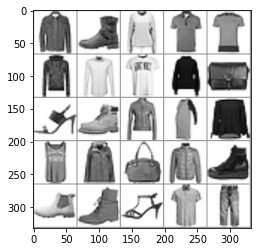

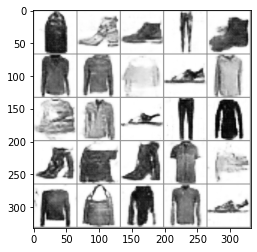

Epochs: 13 Step: 6400 Generator loss: 0.8432537940144539, discriminator loss: 0.12782020404934882


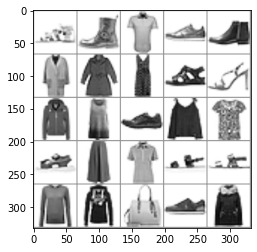

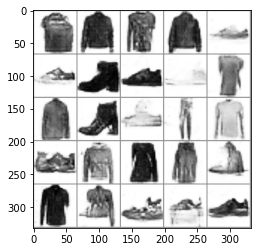

Epochs: 13 Step: 6500 Generator loss: 0.9087121650576592, discriminator loss: 0.09395194165408612


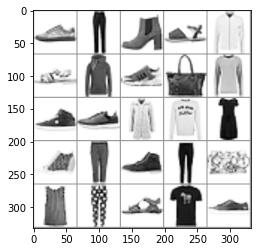

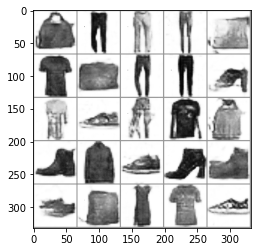

Epochs: 14 Step: 6600 Generator loss: 0.8279287324845791, discriminator loss: 0.12395184492692352


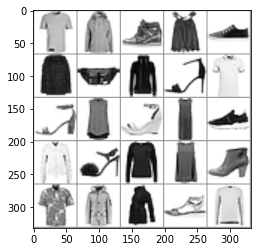

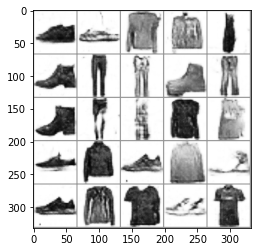

Epochs: 14 Step: 6700 Generator loss: 0.8694839432835579, discriminator loss: 0.13142472347244621


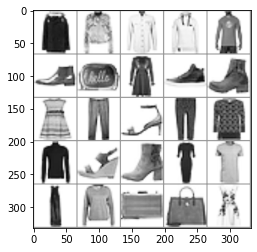

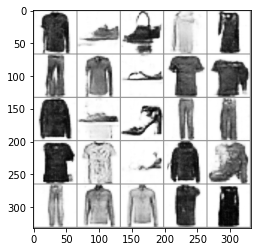

Epochs: 14 Step: 6800 Generator loss: 0.8432208931446076, discriminator loss: 0.10727697084657847


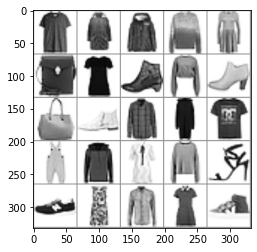

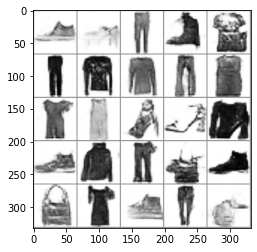

Epochs: 14 Step: 6900 Generator loss: 0.8809761872887611, discriminator loss: 0.12372518813237549


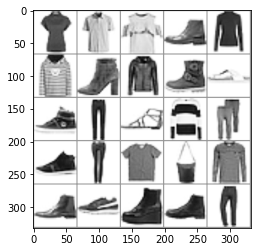

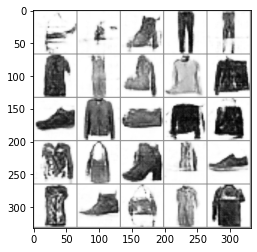

Epochs: 14 Step: 7000 Generator loss: 0.8922608697414398, discriminator loss: 0.11131023984402418


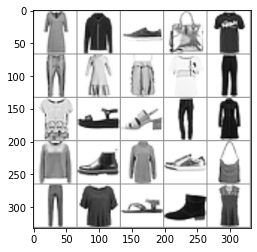

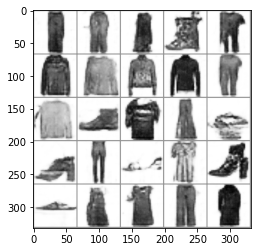

Epochs: 15 Step: 7100 Generator loss: 0.8916686883568764, discriminator loss: 0.09938377592712641


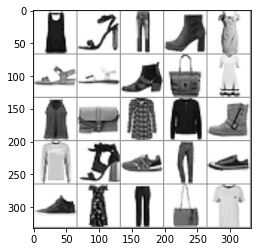

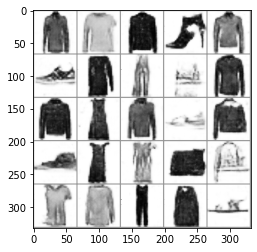

Epochs: 15 Step: 7200 Generator loss: 0.9034440761804581, discriminator loss: 0.09891529864631593


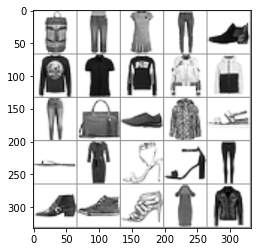

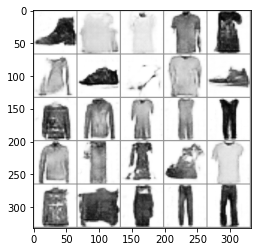

Epochs: 15 Step: 7300 Generator loss: 0.8766547018289566, discriminator loss: 0.11143990211188794


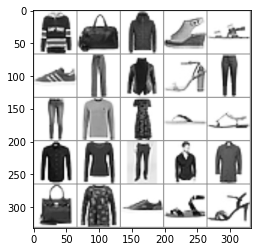

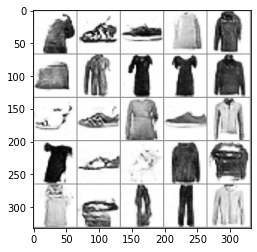

Epochs: 15 Step: 7400 Generator loss: 0.9010288554430008, discriminator loss: 0.1034248923510313


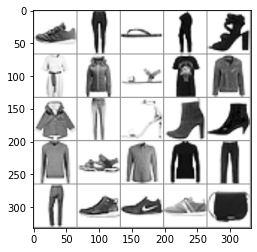

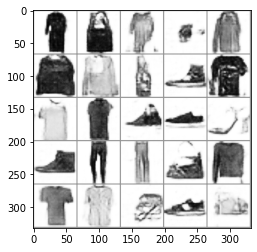

Epochs: 15 Step: 7500 Generator loss: 0.8961802661418915, discriminator loss: 0.10230316717177629


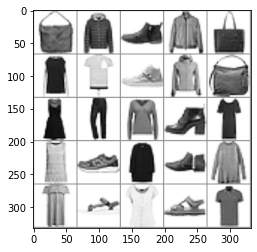

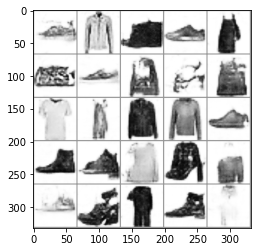

Epochs: 16 Step: 7600 Generator loss: 0.8432935228198767, discriminator loss: 0.16392674217000602


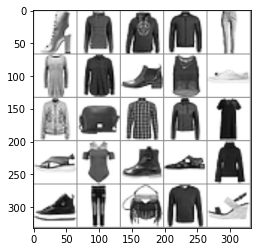

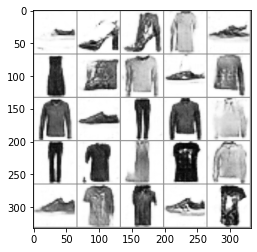

Epochs: 16 Step: 7700 Generator loss: 0.8954230678081513, discriminator loss: 0.07657278177328408


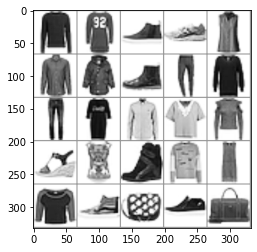

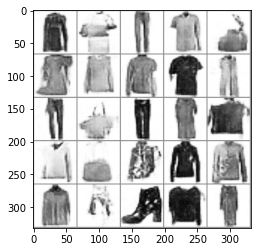

Epochs: 16 Step: 7800 Generator loss: 0.9126836252212525, discriminator loss: 0.09583628263324499


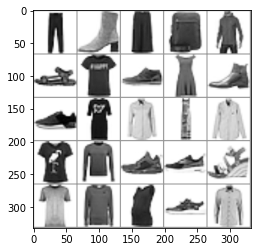

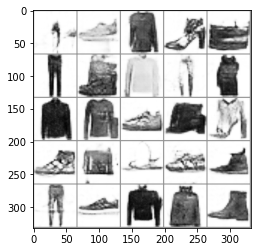

Epochs: 16 Step: 7900 Generator loss: 0.905256234407425, discriminator loss: 0.0979143679793924


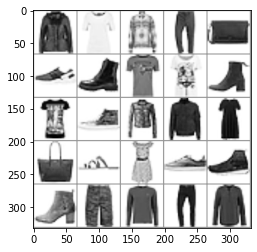

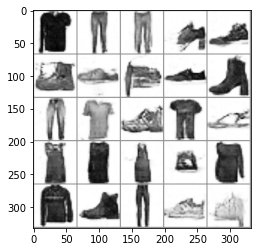

Epochs: 17 Step: 8000 Generator loss: 0.9081947410106659, discriminator loss: 0.09898796242661774


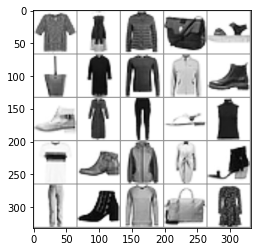

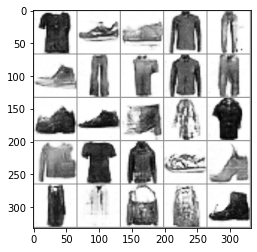

Epochs: 17 Step: 8100 Generator loss: 0.9131933349370956, discriminator loss: 0.09239128954708577


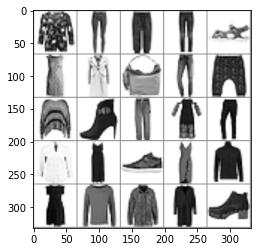

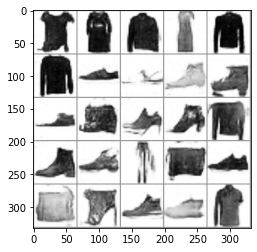

Epochs: 17 Step: 8200 Generator loss: 0.8825220450758934, discriminator loss: 0.10192898370325565


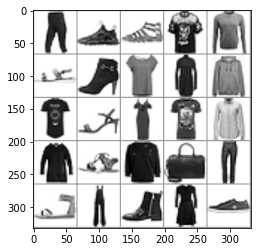

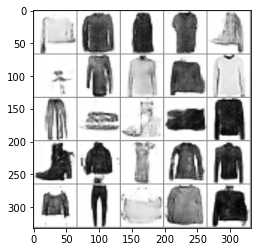

Epochs: 17 Step: 8300 Generator loss: 0.9046844175457954, discriminator loss: 0.10290071805939079


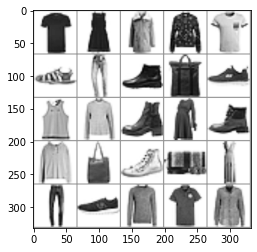

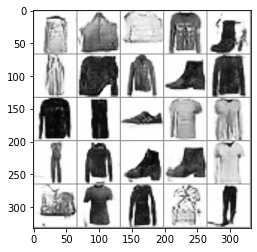

Epochs: 17 Step: 8400 Generator loss: 0.9217427584528923, discriminator loss: 0.08428696716204286


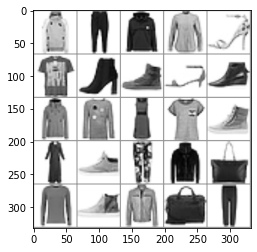

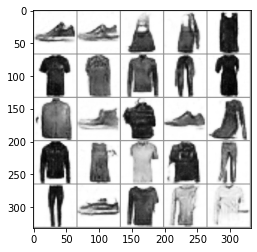

Epochs: 18 Step: 8500 Generator loss: 0.8990328127145767, discriminator loss: 0.10076914912089706


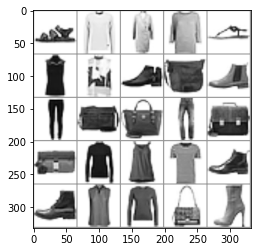

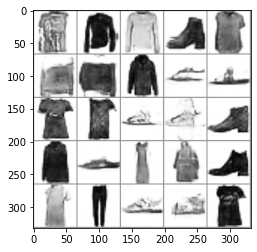

Epochs: 18 Step: 8600 Generator loss: 0.9327193248271942, discriminator loss: 0.08812357507646083


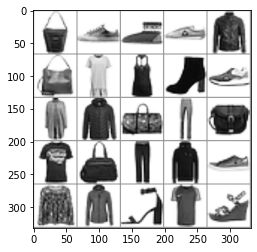

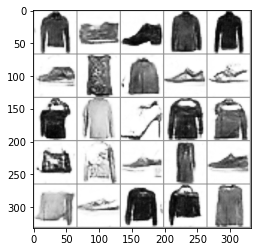

Epochs: 18 Step: 8700 Generator loss: 0.9229204481840134, discriminator loss: 0.08491114877164364


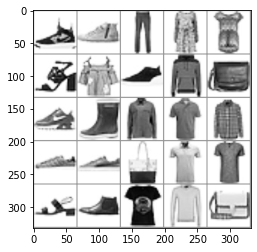

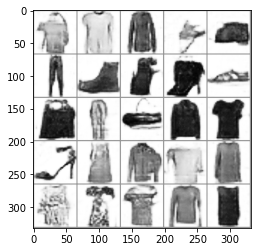

Epochs: 18 Step: 8800 Generator loss: 0.9158469611406326, discriminator loss: 0.08963760940358043


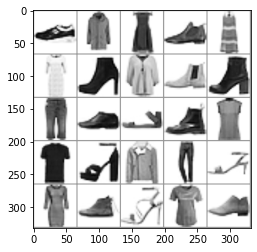

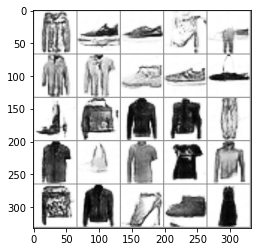

Epochs: 18 Step: 8900 Generator loss: 0.8992501884698868, discriminator loss: 0.0950287792365998


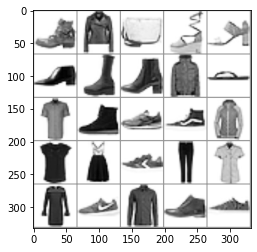

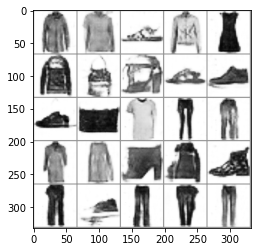

Epochs: 19 Step: 9000 Generator loss: 0.9263768771290779, discriminator loss: 0.08629772846587003


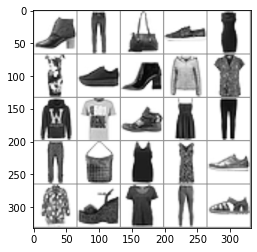

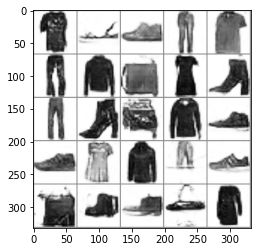

Epochs: 19 Step: 9100 Generator loss: 0.9406144161522388, discriminator loss: 0.08861486843787134


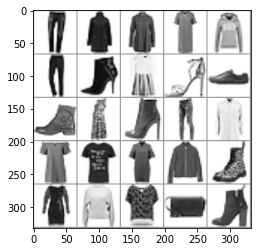

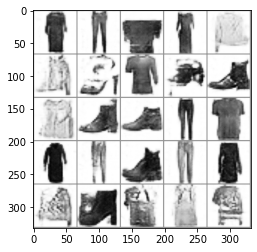

Epochs: 19 Step: 9200 Generator loss: 0.9376135832071304, discriminator loss: 0.07746073755435645


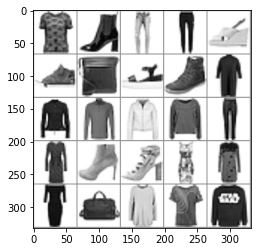

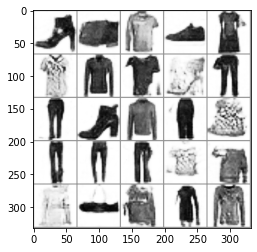

Epochs: 19 Step: 9300 Generator loss: 0.9303944531083107, discriminator loss: 0.09947722581215203


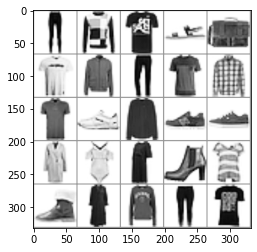

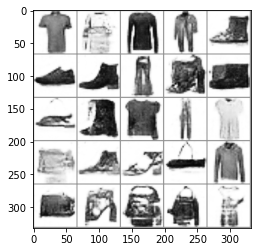

Epochs: 20 Step: 9400 Generator loss: 0.9439094939827919, discriminator loss: 0.08141254277899862


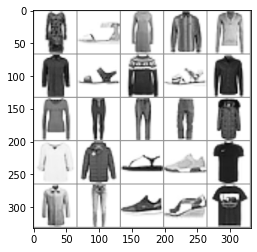

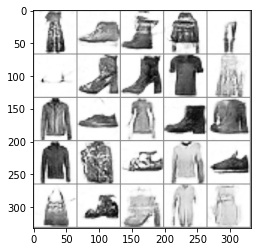

Epochs: 20 Step: 9500 Generator loss: 0.8826683454215527, discriminator loss: 0.09487248253077268


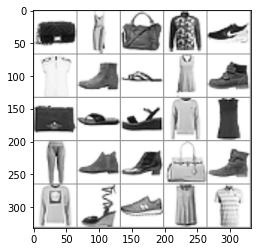

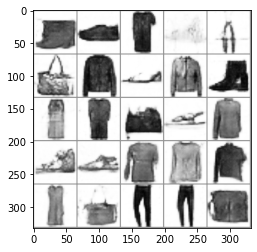

Epochs: 20 Step: 9600 Generator loss: 0.9467229184508323, discriminator loss: 0.07019466472789646


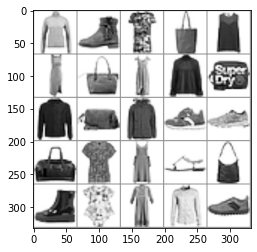

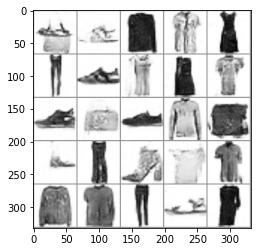

Epochs: 20 Step: 9700 Generator loss: 0.8987015381455421, discriminator loss: 0.0987526407558471


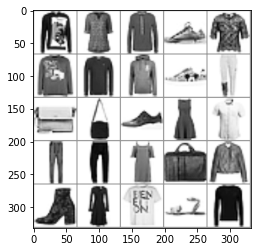

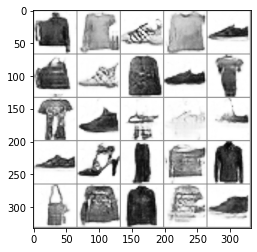

Epochs: 20 Step: 9800 Generator loss: 0.9477024912834168, discriminator loss: 0.07889078132808208


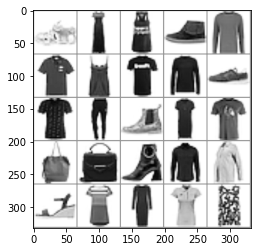

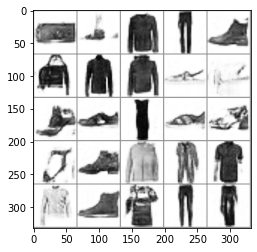

Epochs: 21 Step: 9900 Generator loss: 0.9608754703402519, discriminator loss: 0.06905410809442401


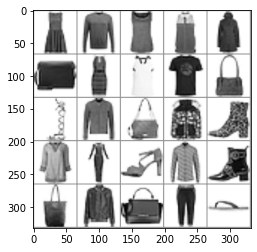

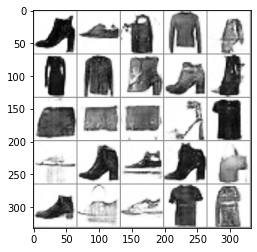

Epochs: 21 Step: 10000 Generator loss: 0.9307855647802353, discriminator loss: 0.07871213092003018


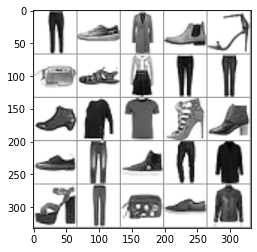

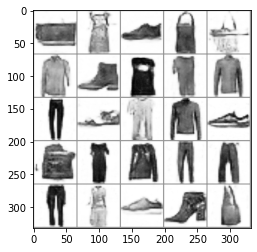

Epochs: 21 Step: 10100 Generator loss: 0.868000540137291, discriminator loss: 0.11530944144353271


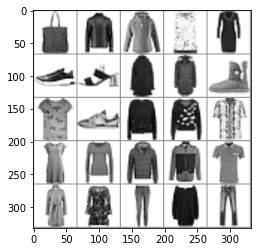

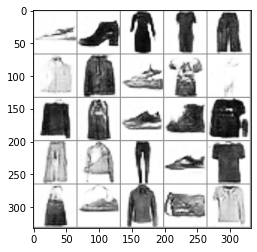

Epochs: 21 Step: 10200 Generator loss: 0.9698633217811584, discriminator loss: 0.06599516676738858


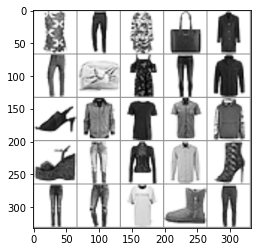

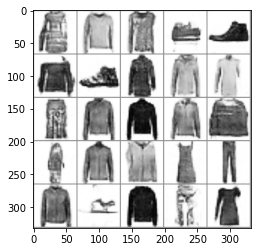

Epochs: 21 Step: 10300 Generator loss: 0.9534802934527398, discriminator loss: 0.0628874132875353


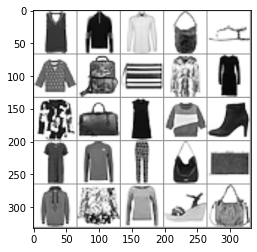

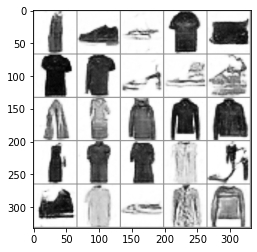

Epochs: 22 Step: 10400 Generator loss: 0.9083482395112514, discriminator loss: 0.08878548474982381


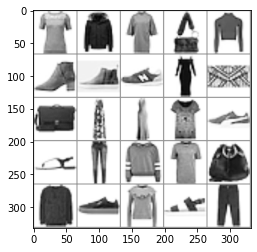

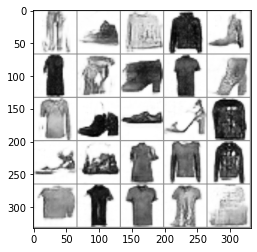

KeyboardInterrupt: 

In [18]:
n_epochs = 100
step = 100
current_step = 0
generator_losses = 0
discriminator_losses = 0
os.makedirs("LSGAN", exist_ok=True)

for epoch in range(n_epochs):
    for real, _ in(dataloader):
        real = real.to(device)
        
        disc_opt.zero_grad()
        fake_noise = get_noise(len(real), z_dim)
        fake_img = gen(fake_noise)
        disc_preds_fake = disc(fake_img.detach()).reshape(-1)
        disc_fake_loss = criterion(disc_preds_fake, torch.zeros_like(disc_preds_fake))
        disc_preds_real = disc(real).reshape(-1)
        disc_real_loss = criterion(disc_preds_real, torch.ones_like(disc_preds_real))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph = True)
        disc_opt.step()
        discriminator_losses += disc_loss.item()

        
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(len(real), z_dim)
        fake_img_2 = gen(fake_noise_2)
        disc_preds_fake = disc(fake_img_2).reshape(-1)
        gen_loss = criterion(disc_preds_fake, torch.ones_like(disc_preds_fake))
        gen_loss.backward()
        gen_opt.step()
        
        generator_losses += gen_loss.item()
        
        if current_step % step == 0 and current_step > 0:
            print(f"Epochs: {epoch} Step: {current_step} Generator loss: {generator_losses / step}, discriminator loss: {discriminator_losses / step}")
            img_grid_real = torchvision.utils.make_grid(real[:25], nrow = 5)
            img_grid_fake = torchvision.utils.make_grid(fake_img[:25], nrow = 5)
            save_image(fake_img_2.data[:36], "LSGAN/%d.png" % current_step, nrow=6, normalize=True)
            matplotlib_imshow(img_grid_real, one_channel=True)
            matplotlib_imshow(img_grid_fake,  one_channel=True)
            generator_losses = 0
            discriminator_losses = 0
        current_step += 1